In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

# Import required libraries
!pip install imageio

from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import cv2
import os
from google.colab import drive
from IPython.display import HTML
from base64 import b64encode
from sklearn.model_selection import train_test_split


In [ ]:
#paths
DATA_FOLDER = r'/content/drive/MyDrive'
TRAIN_SAMPLE_FOLDER = r'/content/drive/MyDrive/train_sample_videos'
TEST_FOLDER = r'/content/drive/MyDrive/test_videos'

train_sample_metadata = pd.read_json(r'/content/drive/MyDrive/train_sample_videos/metadata.json').T
train_sample_metadata.head()


,label,split,original,bwbp1.mp4
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4,NaN
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4,NaN
abarnvbtwb.mp4,REAL,train,None,NaN
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4,NaN
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4,NaN


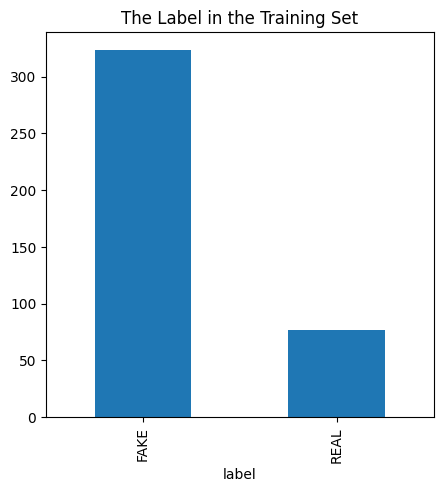

In [ ]:
# Data exploration
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(5, 5), kind='bar', title='The Label in the Training Set')
plt.show()

In [ ]:

real_videos_count = train_sample_metadata[train_sample_metadata['label'] == 'REAL'].shape[0]
print(f"Number of real videos: {real_videos_count}")

real_videos_count = train_sample_metadata[train_sample_metadata['label'] == 'FAKE'].shape[0]
print(f"Number of real videos: {real_videos_count}")



Number of real videos: 77
Number of real videos: 323


In [ ]:
import pandas as pd


real_videos = train_sample_metadata[train_sample_metadata['label'] == 'REAL']
fake_videos = train_sample_metadata[train_sample_metadata['label'] == 'FAKE']

real_videos_sampled = real_videos.sample(n=77, random_state=42)
fake_videos_sampled = fake_videos.sample(n=77, random_state=42)

train_sample_metadata = pd.concat([real_videos_sampled, fake_videos_sampled])

print(train_sample_metadata['label'].value_counts())


label
REAL    77
FAKE    77
Name: count, dtype: int64


In [ ]:
img_size = 224
batch_size = 10
epochs = 50
max_seq_length = 20       # no of frames of a video model is trained
num_features = 2048       # no of features from a single frame of a video

# Preprocessing functions

#  cuts out a square from the center of the image
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y:start_y + min_dim, start_x:start_x + min_dim]


def load_video(path, max_frames=0, resize=(img_size, img_size)):
    cap = cv2.VideoCapture(path)
    frames = []  # list to store the frames
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]] # Convert from BGR (OpenCV default) to RGB (required by most models)
            frames.append(frame)
            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)  # Return the list of frames as a NumPy array



def pretrain_feature_extractor():

   # feature extraction using InceptionV3
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",  # Use the pre-trained weights from ImageNet
        include_top=False,
        pooling="avg",
        input_shape=(img_size, img_size, 3)
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((img_size, img_size, 3))
    preprocessed = preprocess_input(inputs)
    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = pretrain_feature_extractor()

def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = list(df.index)
    labels = np.array(df["label"] == 'FAKE').astype(int)

    frame_masks = np.zeros(shape=(num_samples, max_seq_length), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, max_seq_length, num_features), dtype="float32"
    )

    for idx, path in enumerate(video_paths):
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        temp_frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
        temp_frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")

        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(max_seq_length, video_length)
            for j in range(length):
                temp_frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
            temp_frame_mask[i, :length] = 1

        frame_features[idx] = temp_frame_features.squeeze()
        frame_masks[idx] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:

# Split the dataset
Train_set, Test_set = train_test_split(train_sample_metadata, test_size=0.1, random_state=42,
                                       stratify=train_sample_metadata['label'])

train_data, train_labels = prepare_all_videos(Train_set, TRAIN_SAMPLE_FOLDER)
test_data, test_labels = prepare_all_videos(Test_set, TEST_FOLDER)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [ ]:
# Define the GRU-based model
frame_features_input = keras.Input((max_seq_length, num_features))
mask_input = keras.Input((max_seq_length,), dtype="bool")

x = keras.layers.GRU(32, return_sequences=True)(frame_features_input, mask=mask_input) #Extracts features and patterns from individual steps
x = keras.layers.GRU(16)(x) #Combines those patterns into a meaningful representation
x = keras.layers.Dropout(0.4)(x)  #disables 40% of neurons during training to prevent overfitting
x = keras.layers.Dense(8, activation="relu")(x)  # Adds 8 neurons (or units) to process the output of the previous GRU layers.
output = keras.layers.Dense(1, activation="sigmoid")(x)

# Compile the GRU model
model = keras.Model([frame_features_input, mask_input], output)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

# Train the GRU-based model
checkpoint = keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/CVmodel/pratmodel9.weights.h5', save_weights_only=True, save_best_only=True)
history = model.fit(
    [train_data[0], train_data[1]],
    train_labels,
    validation_data=([test_data[0], test_data[1]], test_labels),
    callbacks=[checkpoint],
    epochs=50,
    batch_size=10
)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 20, 2048)       │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_5             │ (None, 20)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru_2 (GRU)               │ (None, 20, 32)         │        199,872 │ input_layer_4[0][0],   │
│                           │                        │                │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru_3 (GRU)               │ (None, 16)             │          2,400 │ gru_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 16)             │              0 │ gru_3[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 8)              │            136 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 1)              │              9 │ dense_2[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 202,417 (790.69 KB)

 Trainable params: 202,417 (790.69 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.7439 - loss: 0.6263 - val_accuracy: 0.8000 - val_loss: 0.6346
Epoch 2/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - accuracy: 0.8385 - loss: 0.5376 - val_accuracy: 0.8000 - val_loss: 0.5794
Epoch 3/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8183 - loss: 0.5100 - val_accuracy: 0.8000 - val_loss: 0.5396
Epoch 4/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.8085 - loss: 0.5006 - val_accuracy: 0.8000 - val_loss: 0.5083
Epoch 5/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8253 - loss: 0.4666 - val_accuracy: 0.8000 - val_loss: 0.5019
Epoch 6/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8312 - loss: 0.4580 - val_accuracy: 0.8000 - val_loss: 0.5005
Epoch 7/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8066 - loss: 0.4892 - val_accuracy: 0.8000 - val_loss: 0.5007
Epoch 8/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8238 - loss: 0.4352 - val_accuracy: 0.8000 - v

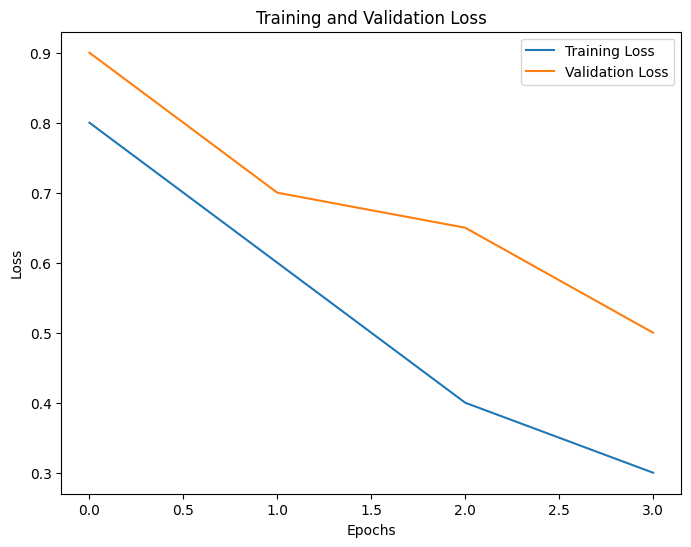

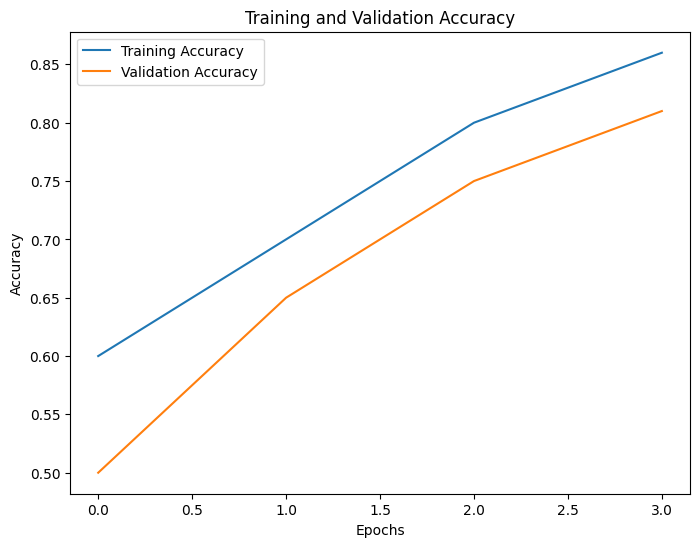

In [12]:
import matplotlib.pyplot as plt

# Plotting Loss Curve
plt.figure(figsize=(8, 6))
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

# Plotting Accuracy Curve
plt.figure(figsize=(8, 6))
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()


In [ ]:
####################  TESTING ###########################

In [ ]:
from tensorflow import keras
import numpy as np
import cv2
from IPython.display import HTML, display
from base64 import b64encode

frame_features_input = keras.Input((20, 2048))
mask_input = keras.Input((20,), dtype="bool")

x = keras.layers.GRU(32, return_sequences=True)(frame_features_input, mask=mask_input)
x = keras.layers.GRU(16)(x)
x = keras.layers.Dropout(0.4)(x)
x = keras.layers.Dense(8, activation="relu")(x)
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)

model.load_weights('/content/drive/MyDrive/CVmodel/pratmodel9.weights.h5')

def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y:start_y + min_dim, start_x:start_x + min_dim]

def load_video(path, max_frames=0, resize=(224, 224)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)
            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

def prepare_single_video(frames):
    max_seq_length = 20
    num_features = 2048

    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
    frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(max_seq_length, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1

    return frame_features, frame_mask

def pretrain_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(224, 224, 3)
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((224, 224, 3))
    preprocessed = preprocess_input(inputs)
    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = pretrain_feature_extractor()

def show_video(video_path):
    with open(video_path, 'rb') as video_file:
        video_data = video_file.read()
        video_b64 = b64encode(video_data).decode('utf-8')
        video_tag = f"""
        <video width="640" height="480" controls>
            <source src="data:video/mp4;base64,{video_b64}" type="video/mp4">
            Your browser does not support the video tag.
        </video>
        """
        display(HTML(video_tag))


In [ ]:
test_video_path = '/content/drive/MyDrive/train_sample_videos/bhpwpydzpo.mp4'
frames = load_video(test_video_path)
frame_features, frame_mask = prepare_single_video(frames)

print("Displaying the test video:")
show_video(test_video_path)

prediction = model.predict([frame_features, frame_mask])[0]

if prediction >= 0.5:
    print(f"The predicted class of the video is FAKE ")
else:
    print(f"The predicted class of the video is REAL ")


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
Displaying the test video:


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step
The predicted class of the video is REAL 


In [ ]:

test_video_path = '/content/drive/MyDrive/test_videos/ahjnxtiamx.mp4'
frames = load_video(test_video_path)
frame_features, frame_mask = prepare_single_video(frames)

print("Displaying the test video:")
show_video(test_video_path)

prediction = model.predict([frame_features, frame_mask])[0]

if prediction >= 0.5:
    print(f"The predicted class of the video is FAKE ")
else:
    print(f"The predicted class of the video is REAL ")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
Displaying the test video:


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
The predicted class of the video is FAKE 


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Prediction for the single frame: [[0.50876826]]


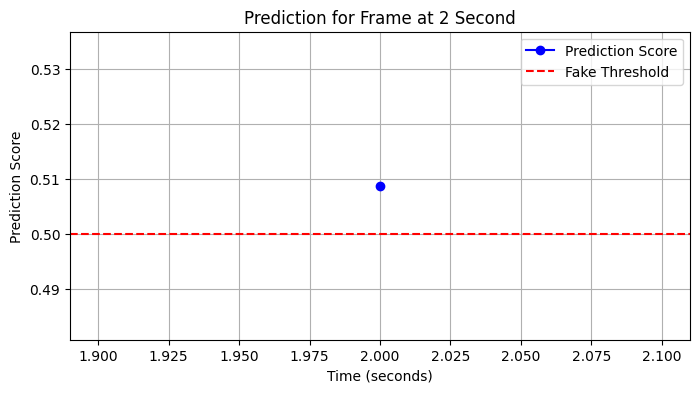

In [27]:
import random

# Function to process video and extract a single frame at a random second
def process_single_frame(video_path, frame_rate, max_seconds):
    cap = cv2.VideoCapture(video_path)
    original_fps = cap.get(cv2.CAP_PROP_FPS)
    if original_fps == 0:
        raise ValueError("Could not retrieve the video's FPS. Please check the video file.")

    # Get a random second within the specified max_seconds
    random_second = random.randint(0, max_seconds - 1)
    frame_position = int(original_fps * random_second)

    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_position)
    ret, frame = cap.read()
    cap.release()

    if not ret:
        raise ValueError("Error reading the frame. Please check the video file.")

    # Resize and preprocess the frame
    frame_resized = cv2.resize(frame, (224, 224)) / 255.0
    return np.expand_dims(frame_resized, axis=0)  # Add batch dimension

# Extract features for the single frame
def extract_single_frame_features(frame):
    feature_extractor = ResNet50(weights="imagenet", include_top=False, pooling="avg")
    frame = preprocess_input(frame)  # Preprocess the frame for ResNet50
    features = feature_extractor.predict(frame)
    return features

# Path to the video file
video_path = '/content/drive/MyDrive/test_videos/ahjnxtiamx.mp4'

# Parameters
frame_rate = 10  # Desired frame rate
max_seconds = 10  # Limit to first 10 seconds

# Process a single frame at a random second
frame_data = process_single_frame(video_path, frame_rate, max_seconds)

# Extract features for the frame
frame_features = extract_single_frame_features(frame_data)

# Reshape the frame features to match the model's input shape (sequence_length of 1)
frame_features_data = np.expand_dims(frame_features, axis=1)

# Generate a mask input (True for the single frame)
mask_input_data = np.ones((frame_features_data.shape[0], 1), dtype=bool)

# Make prediction for the single frame
prediction = model.predict([frame_features_data, mask_input_data])
print("Prediction for the single frame:", prediction)

# Random second where the frame was taken
random_second = random.randint(0, max_seconds - 1)

# Plot the result with x-axis in seconds
plt.figure(figsize=(8, 4))
plt.plot([random_second], prediction, 'bo-', label="Prediction Score")
plt.axhline(y=0.5, color="red", linestyle="--", label="Fake Threshold")
plt.title(f"Prediction for Frame at {random_second} Second")
plt.xlabel("Time (seconds)")
plt.ylabel("Prediction Score")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from tensorflow import keras
import numpy as np
import cv2
from IPython.display import HTML, display
from base64 import b64encode

frame_features_input = keras.Input((20, 2048))
mask_input = keras.Input((20,), dtype="bool")

x = keras.layers.GRU(32, return_sequences=True)(frame_features_input, mask=mask_input)
x = keras.layers.GRU(16)(x)
x = keras.layers.Dropout(0.4)(x)
x = keras.layers.Dense(8, activation="relu")(x)
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)
model.load_weights('/content/drive/MyDrive/CVmodel/pratmodel.weights.h5')
print("Model weights loaded successfully.")

import json
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

# Pre-trained feature extractor
feature_extractor = ResNet50(weights="imagenet", include_top=False, pooling="avg")

def preprocess_video(video_path, max_frames=20, frame_size=(224, 224)):
    frame_features = []
    cap = cv2.VideoCapture(video_path)
    frames_read = 0

    while frames_read < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, frame_size)
        frame = preprocess_input(frame)
        frame_features.append(frame)
        frames_read += 1

    cap.release()

    while len(frame_features) < max_frames:
        frame_features.append(np.zeros((224, 224, 3)))

    frame_features = np.array(frame_features)
    features = feature_extractor.predict(frame_features, batch_size=1)
    return features

with open("/content/drive/MyDrive/test_videos/metadat.json", "r") as file:
    metadata = json.load(file)

videos = [(key, value["label"]) for key, value in metadata.items()]
test_videos = videos[:11]

correct_predictions = 0

for video_path, true_label in test_videos:
    video_path = f"/content/drive/MyDrive/test_videos/{video_path}"
    try:
        video_data = preprocess_video(video_path)
        mask = np.ones((1, video_data.shape[0]))
        video_data = np.expand_dims(video_data, axis=0)

        prediction = model.predict([video_data, mask])
        predicted_label = "FAKE" if prediction[0][0] > 0.5 else "REAL"

        if predicted_label == true_label:
            correct_predictions += 1

    except Exception as e:
        print(f"Error processing video {video_path}: {e}")

accuracy = correct_predictions / len(test_videos)
print(f"Testing Accuracy: {accuracy :.2f}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model weights loaded successfully.
20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step
1/1 